# Importing the Datas

# We have to combine the graphs for the 2 years so, like for 2 years , there will be (12*7)=(84) graphs

In [140]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [141]:
df_2021=pd.read_csv('/content/df_VA_2021 (1).csv')
df_2022=pd.read_csv('/content/df_VA_2022.csv')

In [142]:
df_2021

,values,date,month,year,hour
0,5.6,1,1,2021,0
1,5.6,1,1,2021,1
2,5.6,1,1,2021,2
3,5.2,1,1,2021,3
4,6.0,1,1,2021,4
...,...,...,...,...,...
8755,10.8,31,12,2021,19
8756,10.4,31,12,2021,20
8757,10.4,31,12,2021,21
8758,10.0,31,12,2021,22


In [143]:
print(type(df_2021))

<class 'pandas.core.frame.DataFrame'>


In [144]:
df_2021 = df_2021.drop_duplicates()
df_2021 = df_2021.drop(index=7275)
row_data = {
    'hour': 3,
    'date': 28,
    'month': 3,'year' : 2021, 'values': (df_2021[(df_2021['hour'] == 2) & (df_2021['date'] == 28) & (df_2021['month'] == 3)].iloc[0]['values'])
}
df_2021['date']=df_2021['date'].astype(int)
df_2021['month']=df_2021['month'].astype(int)
df_2021['hour']=df_2021['hour'].astype(int)
row_data_df = pd.DataFrame.from_dict([row_data])
df_2021 = pd.concat([df_2021,row_data_df])
df_2021 = df_2021.sort_values(by=['month', 'date', 'hour'])
df_2021 = df_2021.reset_index(drop=True)
df_2021

,values,date,month,year,hour
0,5.6,1,1,2021,0
1,5.6,1,1,2021,1
2,5.6,1,1,2021,2
3,5.2,1,1,2021,3
4,6.0,1,1,2021,4
...,...,...,...,...,...
8755,10.8,31,12,2021,19
8756,10.4,31,12,2021,20
8757,10.4,31,12,2021,21
8758,10.0,31,12,2021,22


In [145]:
df_2022

,values,date,month,year,hour
0,5.6,1,1,2022,0
1,4.4,1,1,2022,1
2,4.4,1,1,2022,2
3,5.2,1,1,2022,3
4,8.4,1,1,2022,4
...,...,...,...,...,...
8755,6.4,31,12,2022,19
8756,4.4,31,12,2022,20
8757,4.8,31,12,2022,21
8758,4.4,31,12,2022,22


# Naming a new column of the day of the week

In [146]:
df_2021['day'] = ''
a=['Friday','Saturday','Sunday','Monday','Tuesday','Wednesday','Thrusday']
for i in range (0,365):
  for j in range (0,24):
    x=((24*i)+j)
    df_2021.loc[x,'day']=a[i%7]
df_2021

,values,date,month,year,hour,day
0,5.6,1,1,2021,0,Friday
1,5.6,1,1,2021,1,Friday
2,5.6,1,1,2021,2,Friday
3,5.2,1,1,2021,3,Friday
4,6.0,1,1,2021,4,Friday
...,...,...,...,...,...,...
8755,10.8,31,12,2021,19,Friday
8756,10.4,31,12,2021,20,Friday
8757,10.4,31,12,2021,21,Friday
8758,10.0,31,12,2021,22,Friday


In [147]:
df_2022['day'] = ''
a=['Saturday','Sunday','Monday','Tuesday','Wednesday','Thrusday','Friday']
for i in range (0,365):
  for j in range (0,24):
    df_2022.loc[((24*i)+j),'day']=a[i%7]
df_2022

,values,date,month,year,hour,day
0,5.6,1,1,2022,0,Saturday
1,4.4,1,1,2022,1,Saturday
2,4.4,1,1,2022,2,Saturday
3,5.2,1,1,2022,3,Saturday
4,8.4,1,1,2022,4,Saturday
...,...,...,...,...,...,...
8755,6.4,31,12,2022,19,Saturday
8756,4.4,31,12,2022,20,Saturday
8757,4.8,31,12,2022,21,Saturday
8758,4.4,31,12,2022,22,Saturday


# Ploting the graphs

In [148]:
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

a = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Initialize a PdfPages object to save plots
with PdfPages('multiple_plots_VA_2021.pdf') as pdf:
    a=['Monday','Tuesday','Wednesday','Thrusday','Friday','Saturday','Sunday']
    for i in range (1,13):
      fig, axs = plt.subplots(2, 4, figsize=(15, 10))
      for j in range (0,7):
        df_temp2 = df_2022[(df_2022['month'] == i) & (df_2022['day'] == a[j])]
        df_temp2 = df_temp2.reset_index(drop=True)
        x_labels=df_temp2['hour'][0:24]
        y_labels5=df_temp2['values'][0:24]
        y_labels6=df_temp2['values'][24:48]
        y_labels7=df_temp2['values'][48:72]
        y_labels8=df_temp2['values'][72:96]
        df_temp1 = df_2021[(df_2021['month'] == i) & (df_2021['day'] == a[j])]
        df_temp1 = df_temp1.reset_index(drop=True)
        y_labels1=df_temp1['values'][0:24]
        y_labels2=df_temp1['values'][24:48]
        y_labels3=df_temp1['values'][48:72]
        y_labels4=df_temp1['values'][72:96]
        plt.plot(x_labels,y_labels1,label=f"{df_temp1.loc[0,'date']} 2021")
        plt.plot(x_labels,y_labels2,label=f"{df_temp1.loc[24,'date']} 2021")
        plt.plot(x_labels,y_labels3,label=f"{df_temp1.loc[48,'date']} 2021")
        plt.plot(x_labels,y_labels4,label=f"{df_temp1.loc[72,'date']} 2021")
        plt.plot(x_labels,y_labels5,label=f"{df_temp2.loc[0,'date']} 2022")
        plt.plot(x_labels,y_labels6,label=f"{df_temp2.loc[24,'date']} 2022")
        plt.plot(x_labels,y_labels7,label=f"{df_temp2.loc[48,'date']} 2022")
        plt.plot(x_labels,y_labels8,label=f"{df_temp2.loc[72,'date']} 2022")
        plt.xlabel('hours')
        plt.ylabel('values')
        plt.title(f"Day: {a[j]}, Month :{df_temp1.loc[0,'month']} ")
        plt.legend(loc='upper right',fontsize='small')
        plt.subplot(2, 4, (j+1))
      plt.tight_layout()
      pdf.savefig()
      plt.plot()
      plt.close()

# Importing the DK1 files

In [149]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
df_2021=pd.read_csv('/content/DK1_2021.csv')
df_2022=pd.read_csv('/content/DK1_2022.csv')
df_2021

,TotalLoad,year,month,date,hour
0,2042.819946,2021,1,1,0
1,1966.479980,2021,1,1,1
2,1915.500000,2021,1,1,2
3,1892.500000,2021,1,1,3
4,1903.260010,2021,1,1,4
...,...,...,...,...,...
8755,0.000000,2021,12,31,19
8756,0.000000,2021,12,31,20
8757,0.000000,2021,12,31,21
8758,0.000000,2021,12,31,22


# Alloting the day of the year

In [150]:
def allote_2021(df_2021):
    df_2021['day'] = ''
    a = ['Friday', 'Saturday', 'Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday']
    for i in range(0, 365):
        for j in range(0, 24):
            df_2021.loc[((24 * i) + j), 'day'] = a[i % 7]
    return df_2021

# Assuming df_2021 is already defined somewhere
df_2021 = allote_2021(df_2021)

In [151]:
def allote_2022(df_2022):
    df_2022['day'] = ''
    a = ['Saturday', 'Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
    for i in range(0, 365):
        for j in range(0, 24):
            df_2022.loc[((24 * i) + j), 'day'] = a[i % 7]
    return df_2022
df_2022 = allote_2022(df_2022)

In [152]:
df_2022

,TotalLoad,year,month,date,hour,day
0,1339.800049,2022,1,1,0,Saturday
1,1283.859985,2022,1,1,1,Saturday
2,1243.839966,2022,1,1,2,Saturday
3,1229.959961,2022,1,1,3,Saturday
4,1200.010010,2022,1,1,4,Saturday
...,...,...,...,...,...,...
8755,0.000000,2022,12,31,19,Saturday
8756,0.000000,2022,12,31,20,Saturday
8757,0.000000,2022,12,31,21,Saturday
8758,0.000000,2022,12,31,22,Saturday


In [153]:
df_2021

,TotalLoad,year,month,date,hour,day
0,2042.819946,2021,1,1,0,Friday
1,1966.479980,2021,1,1,1,Friday
2,1915.500000,2021,1,1,2,Friday
3,1892.500000,2021,1,1,3,Friday
4,1903.260010,2021,1,1,4,Friday
...,...,...,...,...,...,...
8755,0.000000,2021,12,31,19,Friday
8756,0.000000,2021,12,31,20,Friday
8757,0.000000,2021,12,31,21,Friday
8758,0.000000,2021,12,31,22,Friday


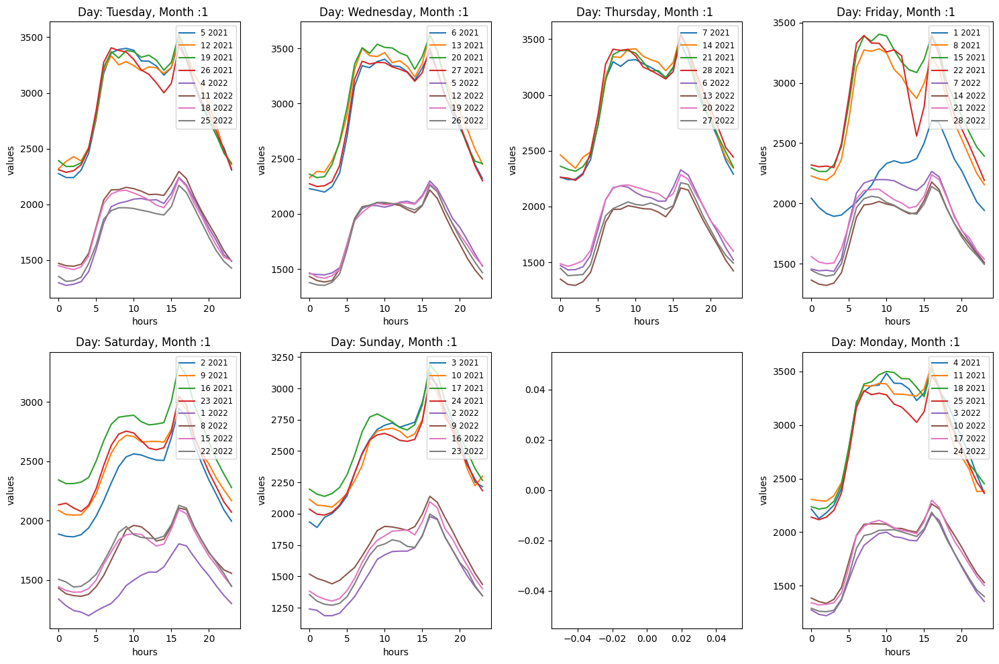

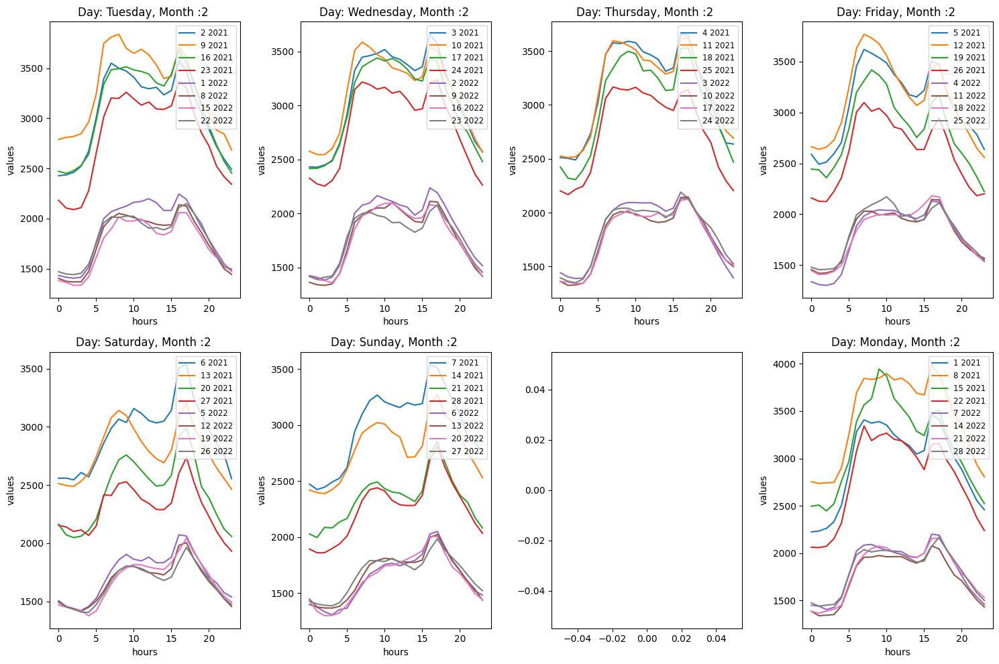

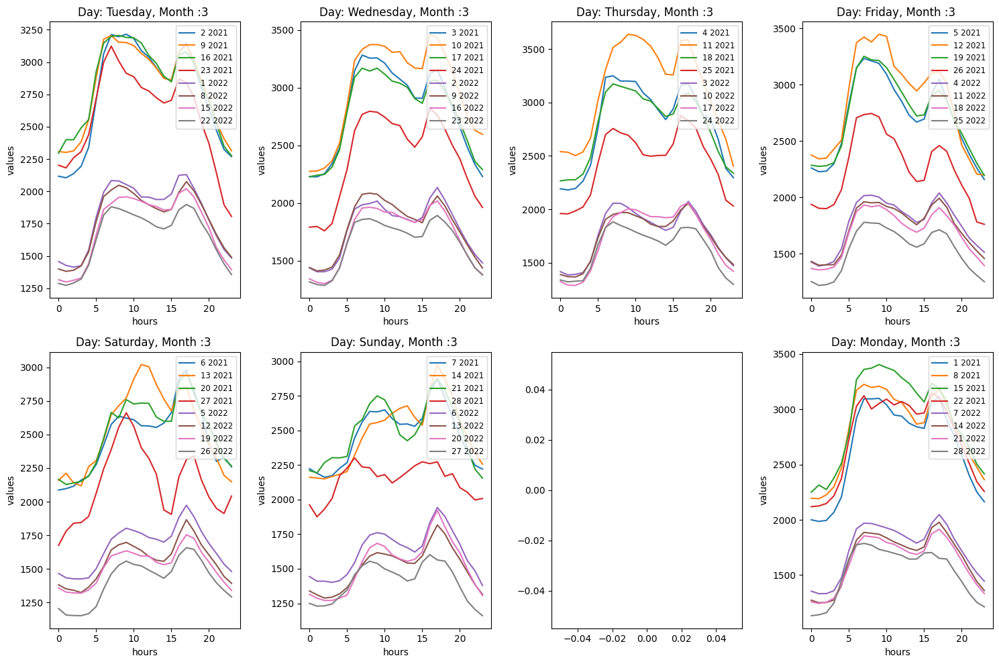

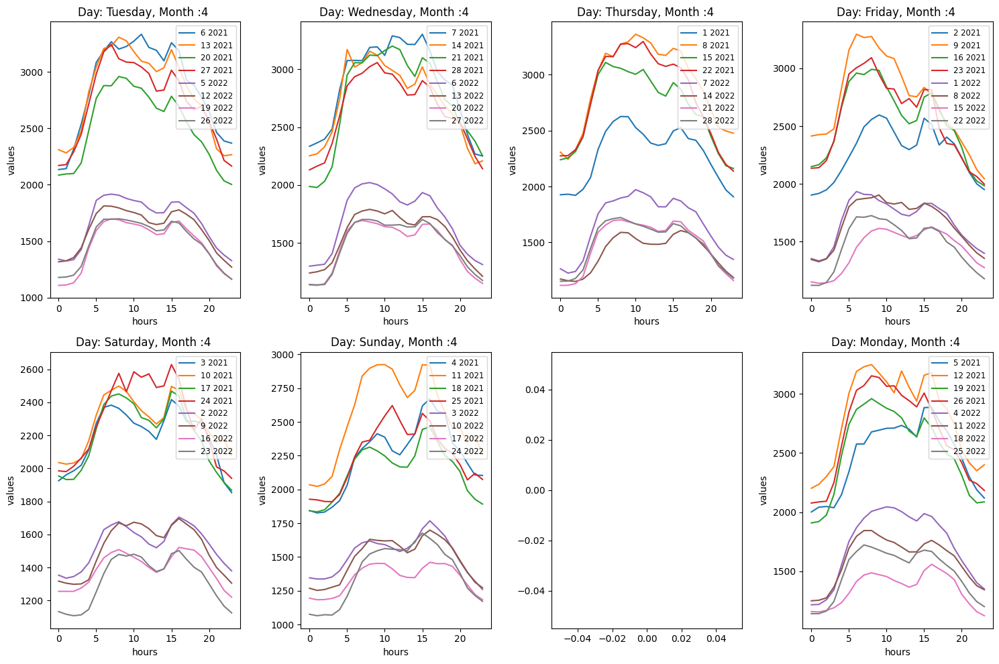

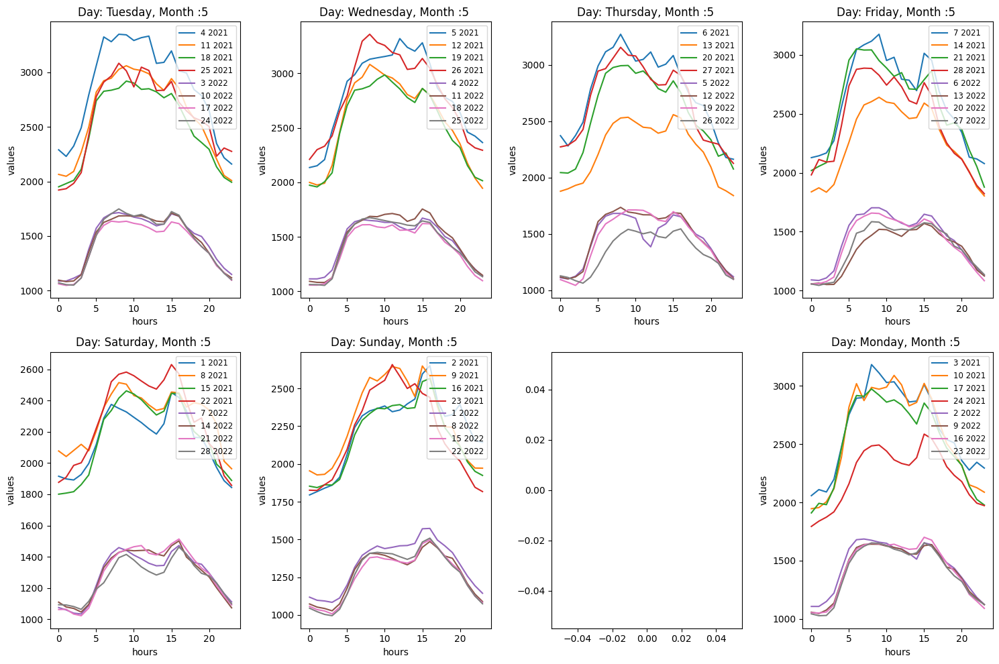

...

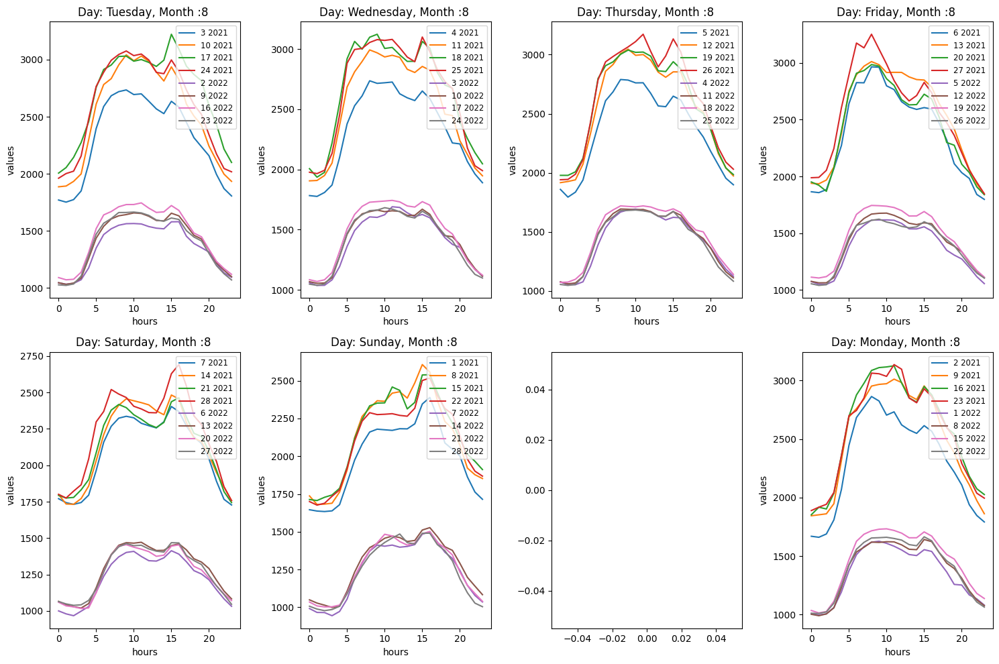

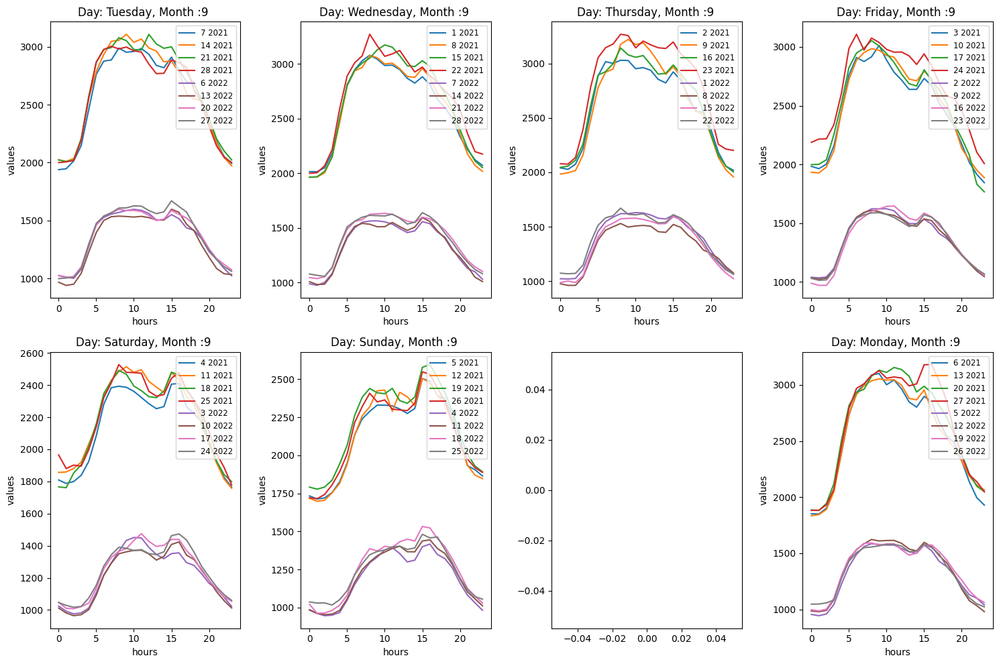

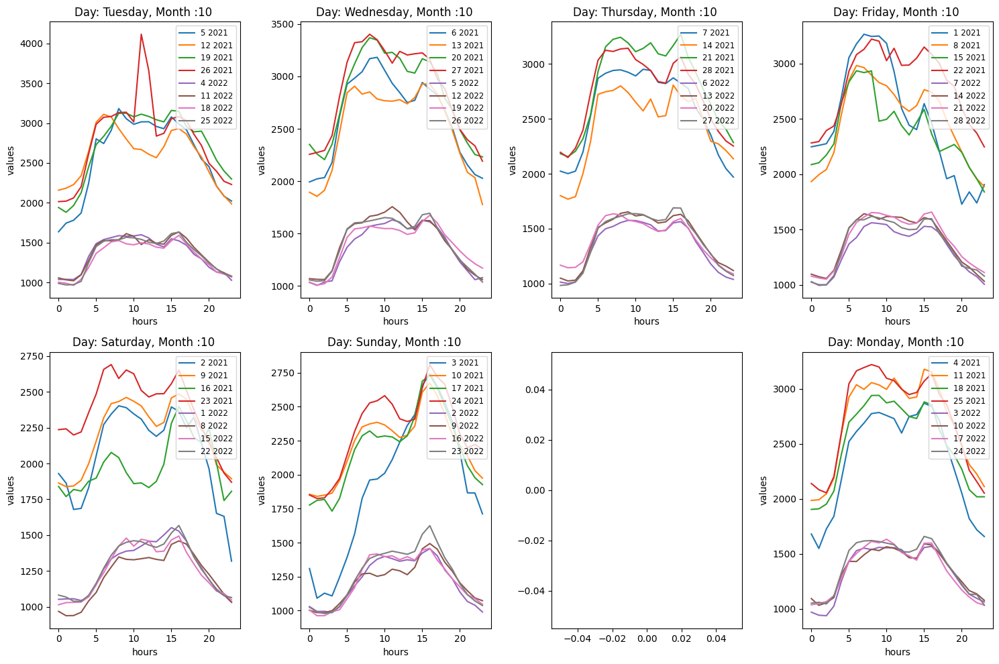

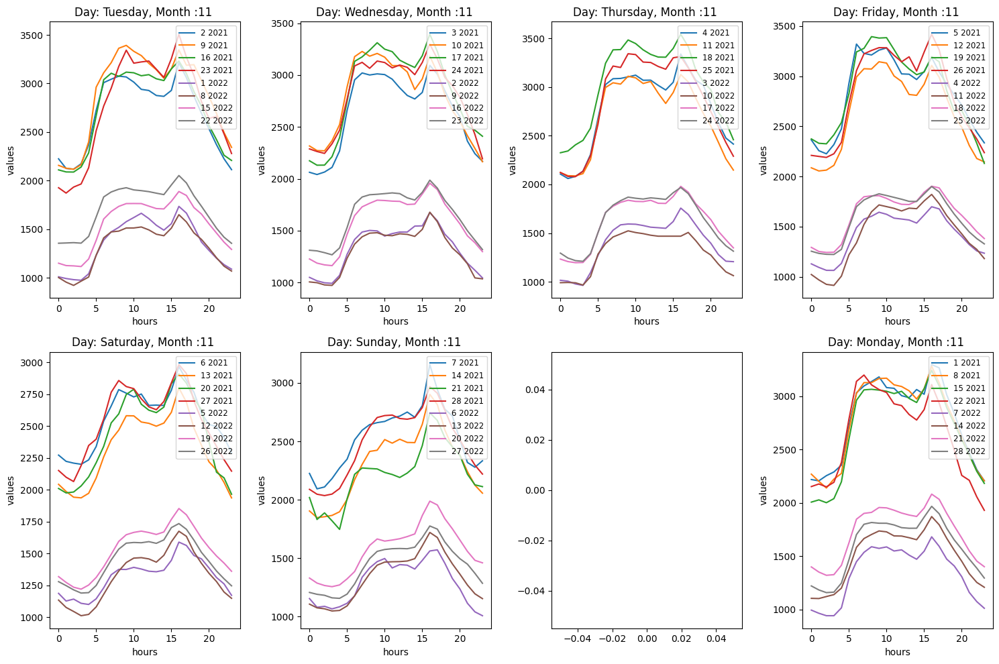

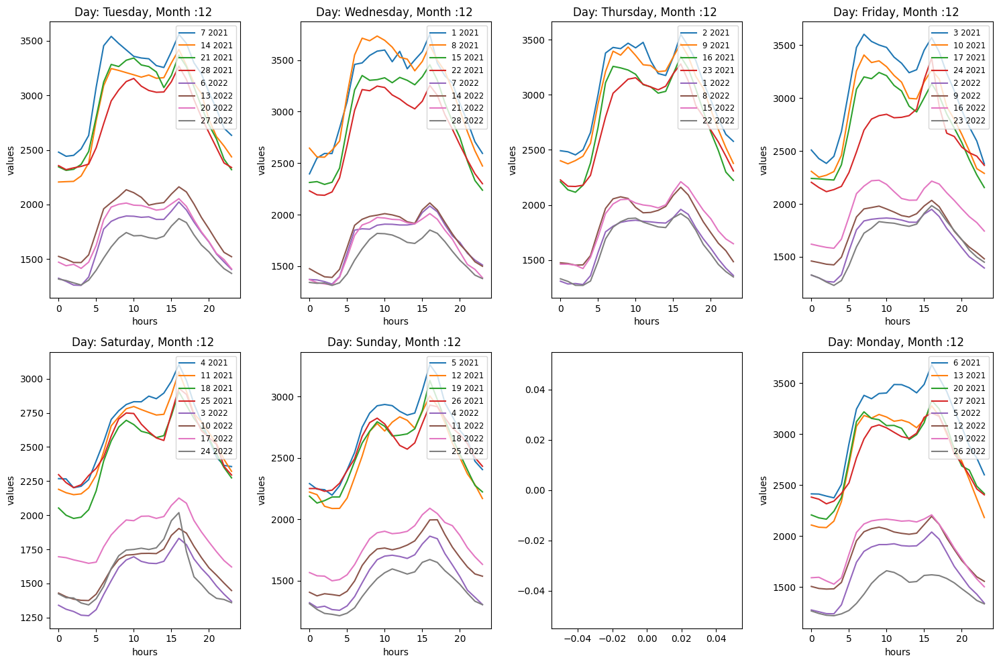

In [139]:
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
def make_graph(df_2022,df_2021,name):
  with PdfPages(f'{name}') as pdf:
      a=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
      for i in range (1,13):
        fig, axs = plt.subplots(2, 4, figsize=(15, 10))
        for j in range (0,7):
          df_temp2 = df_2022[(df_2022['month'] == i) & (df_2022['day'] == a[j])]
          df_temp2 = df_temp2.reset_index(drop=True)
          x_labels=df_temp2['hour'][0:24]
          y_labels5=df_temp2['values'][0:24]
          y_labels6=df_temp2['values'][24:48]
          y_labels7=df_temp2['values'][48:72]
          y_labels8=df_temp2['values'][72:96]
          df_temp1 = df_2021[(df_2021['month'] == i) & (df_2021['day'] == a[j])]
          df_temp1 = df_temp1.reset_index(drop=True)
          y_labels1=df_temp1['values'][0:24]
          y_labels2=df_temp1['values'][24:48]
          y_labels3=df_temp1['values'][48:72]
          y_labels4=df_temp1['values'][72:96]
          plt.plot(x_labels,y_labels1,label=f"{df_temp1.loc[0,'date']} 2021")
          plt.plot(x_labels,y_labels2,label=f"{df_temp1.loc[24,'date']} 2021")
          plt.plot(x_labels,y_labels3,label=f"{df_temp1.loc[48,'date']} 2021")
          plt.plot(x_labels,y_labels4,label=f"{df_temp1.loc[72,'date']} 2021")
          plt.plot(x_labels,y_labels5,label=f"{df_temp2.loc[0,'date']} 2022")
          plt.plot(x_labels,y_labels6,label=f"{df_temp2.loc[24,'date']} 2022")
          plt.plot(x_labels,y_labels7,label=f"{df_temp2.loc[48,'date']} 2022")
          plt.plot(x_labels,y_labels8,label=f"{df_temp2.loc[72,'date']} 2022")
          plt.xlabel('hours')
          plt.ylabel('values')
          plt.title(f"Day: {a[j]}, Month :{df_temp1.loc[0,'month']} ")
          plt.legend(loc='upper right',fontsize='small')
          plt.subplot(2, 4, (j+1))
        plt.tight_layout()
        pdf.savefig()
        plt.plot()
        plt.show()
        plt.close()
df_2021.rename(columns={'TotalLoad': 'values'}, inplace=True)
df_2022.rename(columns={'TotalLoad': 'values'}, inplace=True)
make_graph(df_2022,df_2021,"DK1.pdf")

# DK2

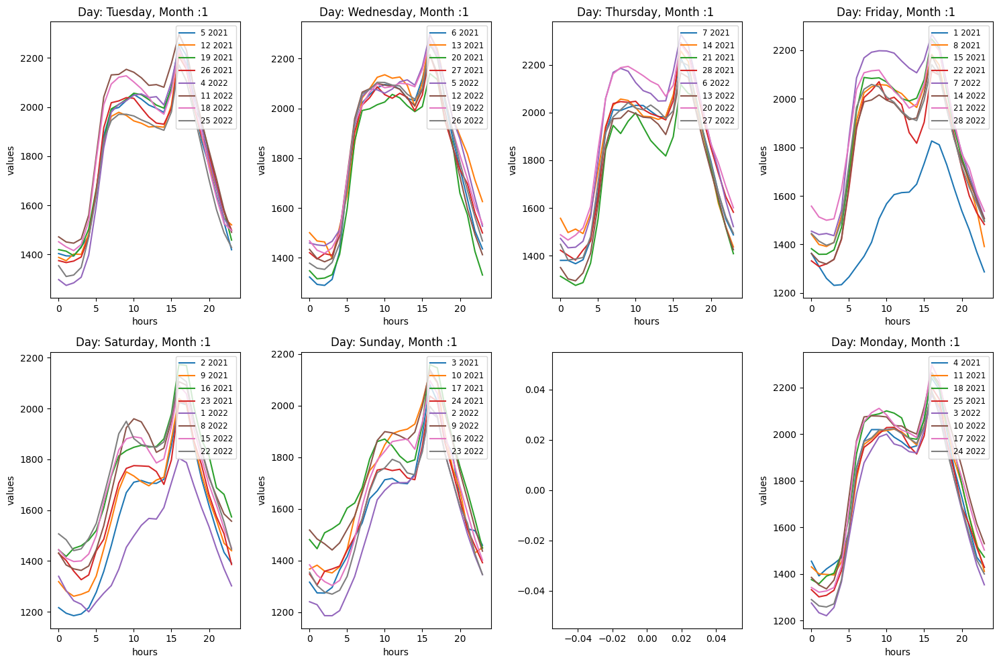

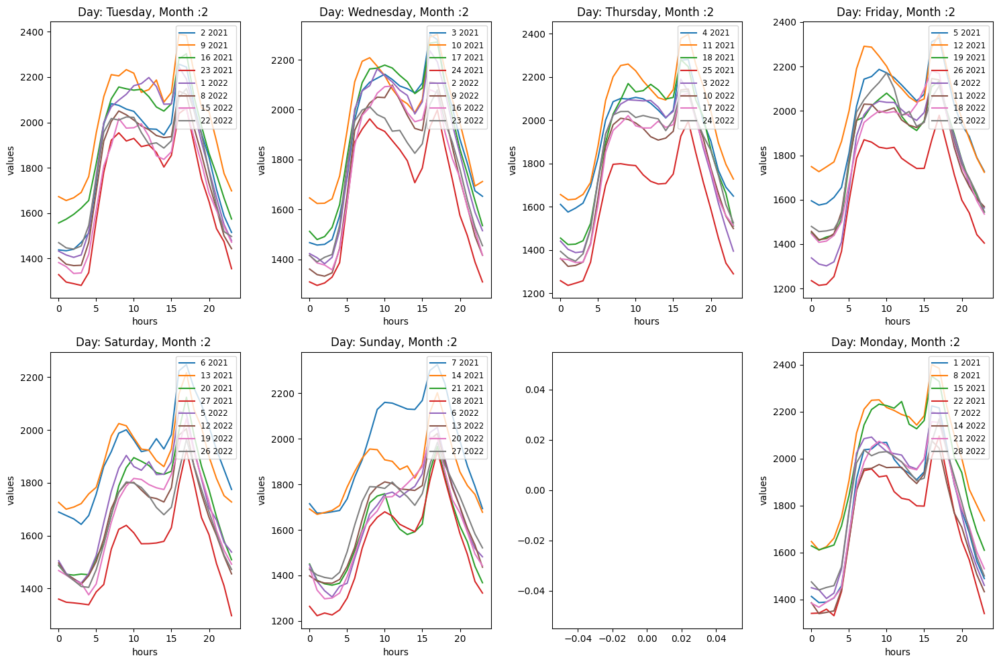

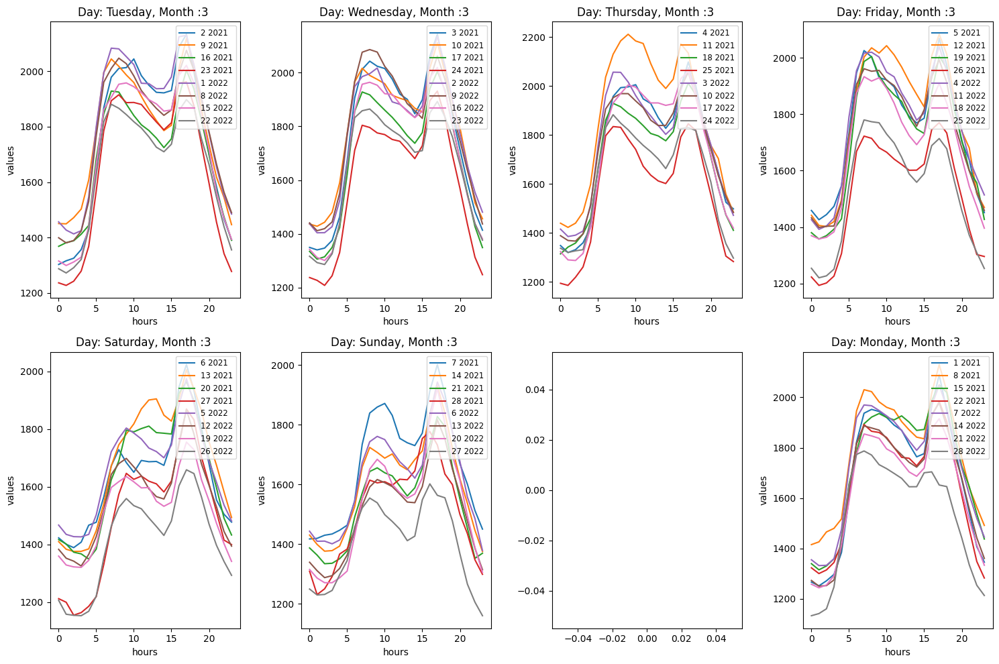

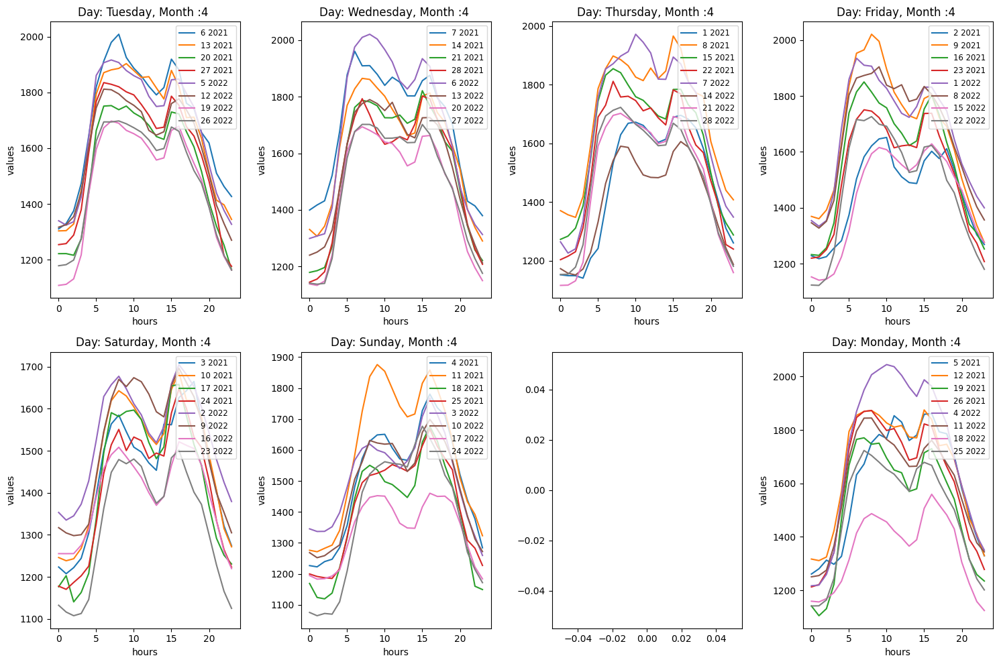

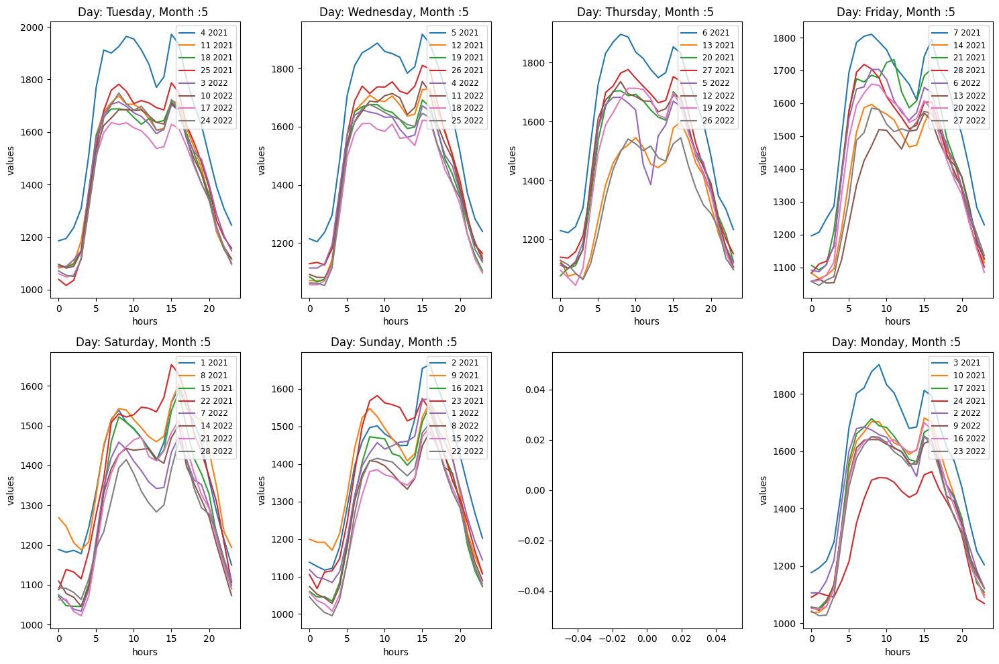

...

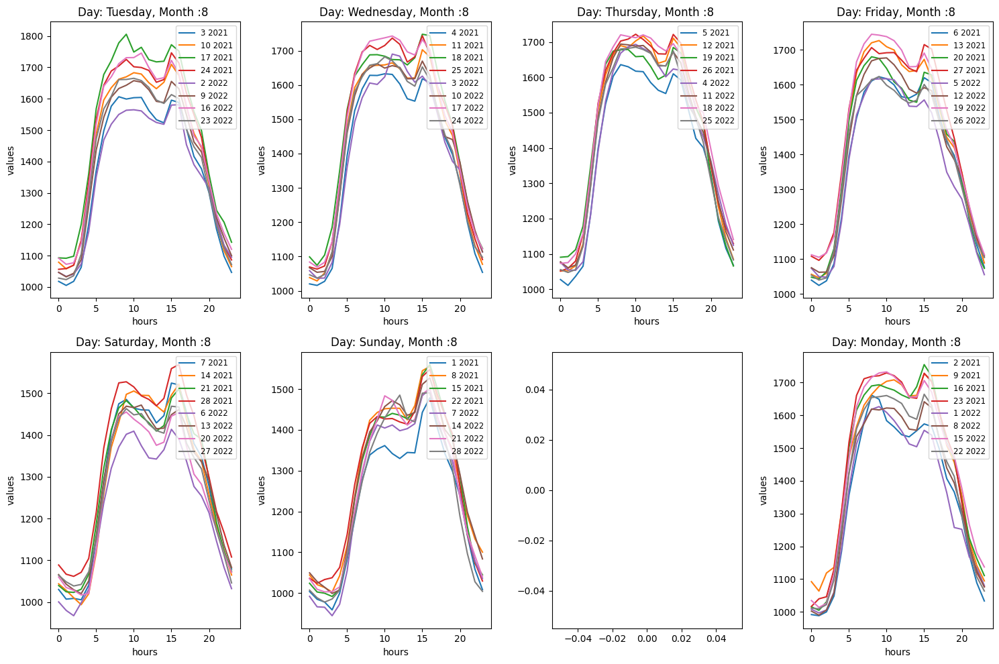

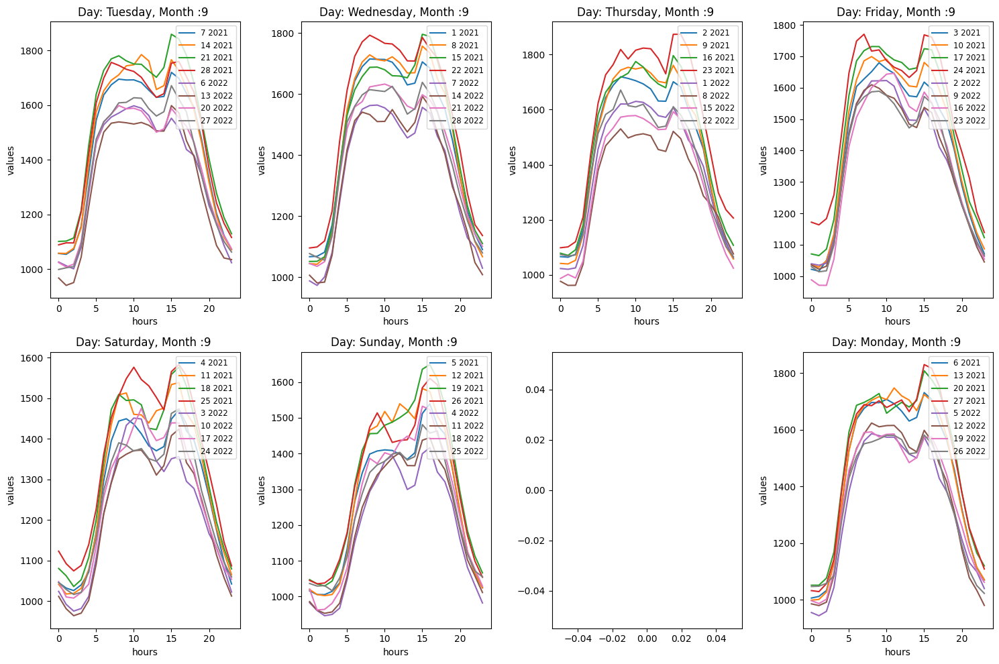

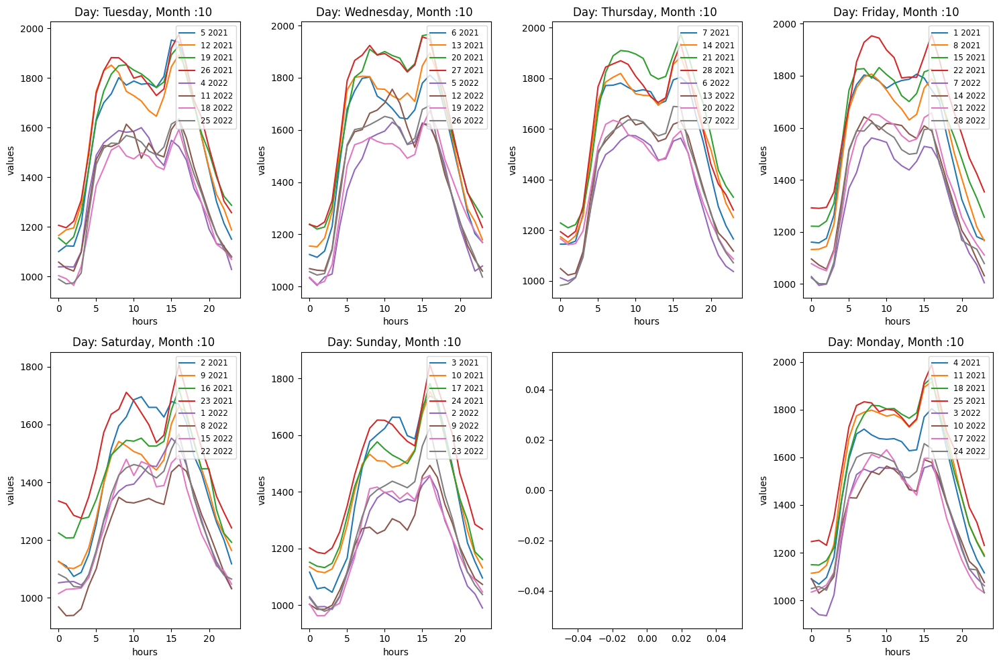

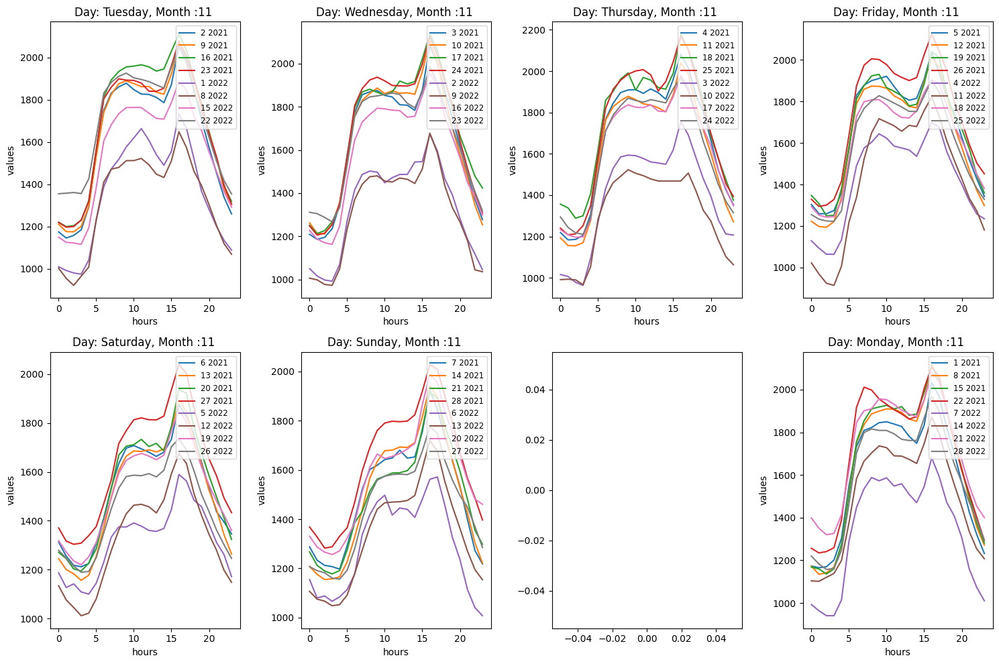

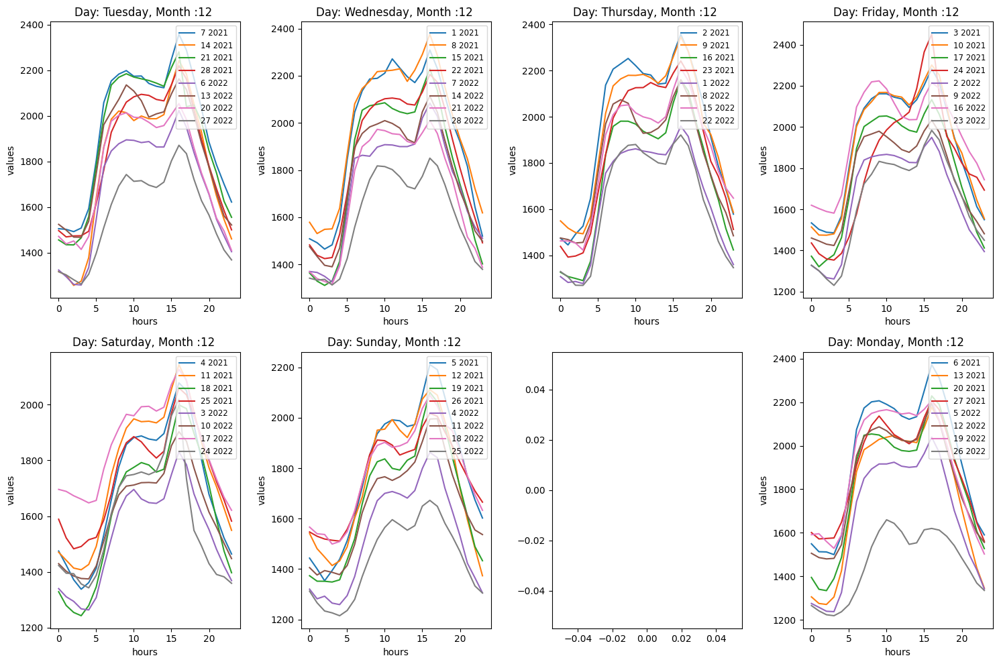

In [155]:
df_2021=pd.read_csv('/content/DK2_2021.csv')
df_2022=pd.read_csv('/content/DK2_2022.csv')
df_2021=allote_2021(df_2021)
df_2022=allote_2022(df_2022)
df_2021.rename(columns={'TotalLoad': 'values'}, inplace=True)
df_2022.rename(columns={'TotalLoad': 'values'}, inplace=True)
make_graph(df_2022,df_2021,'DK2.pdf')

# NO

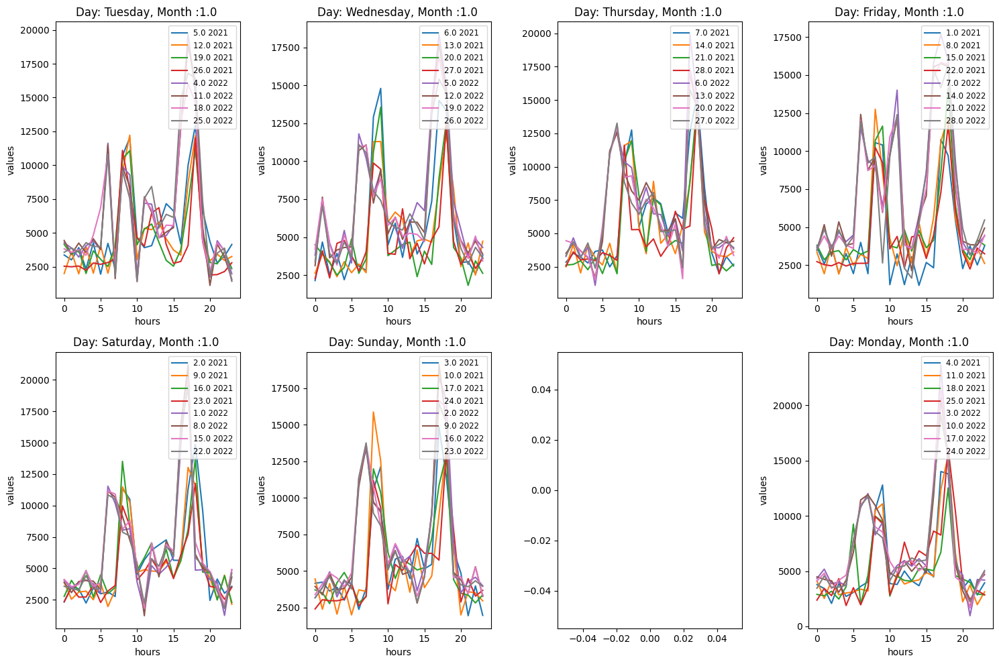

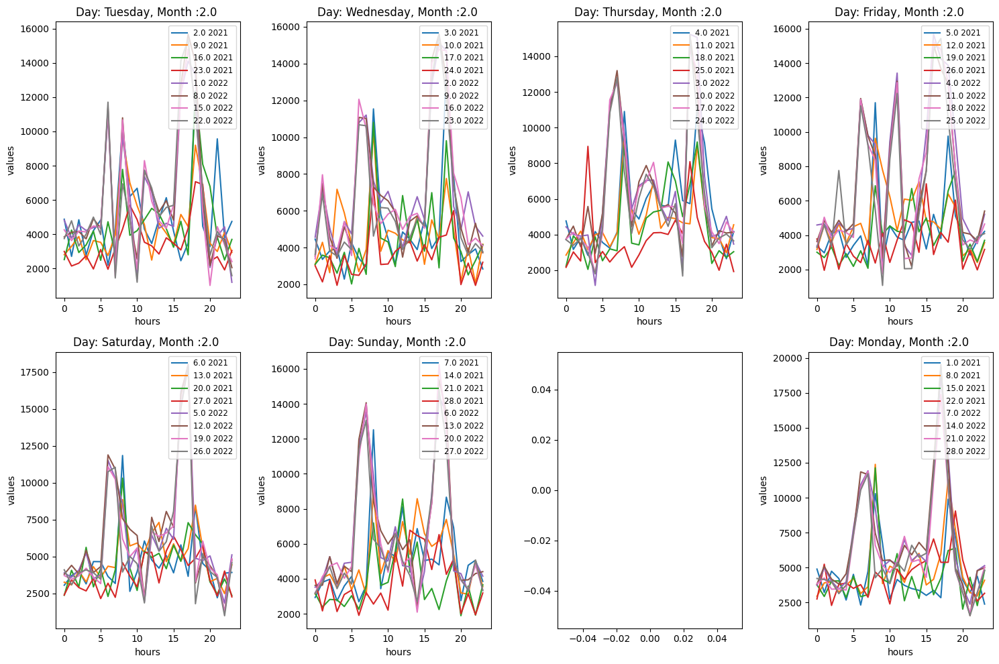

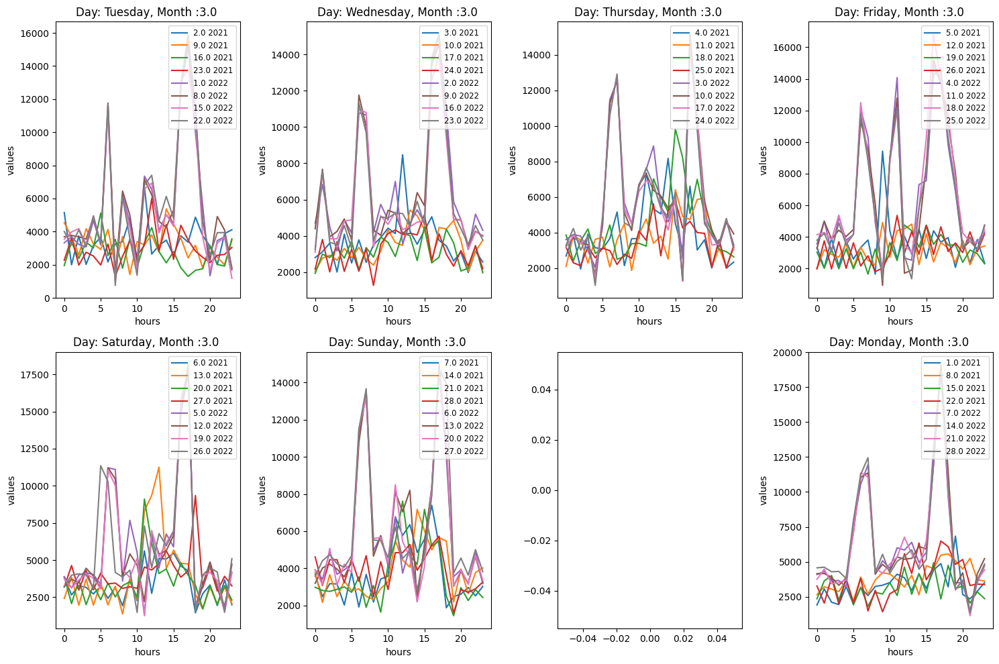

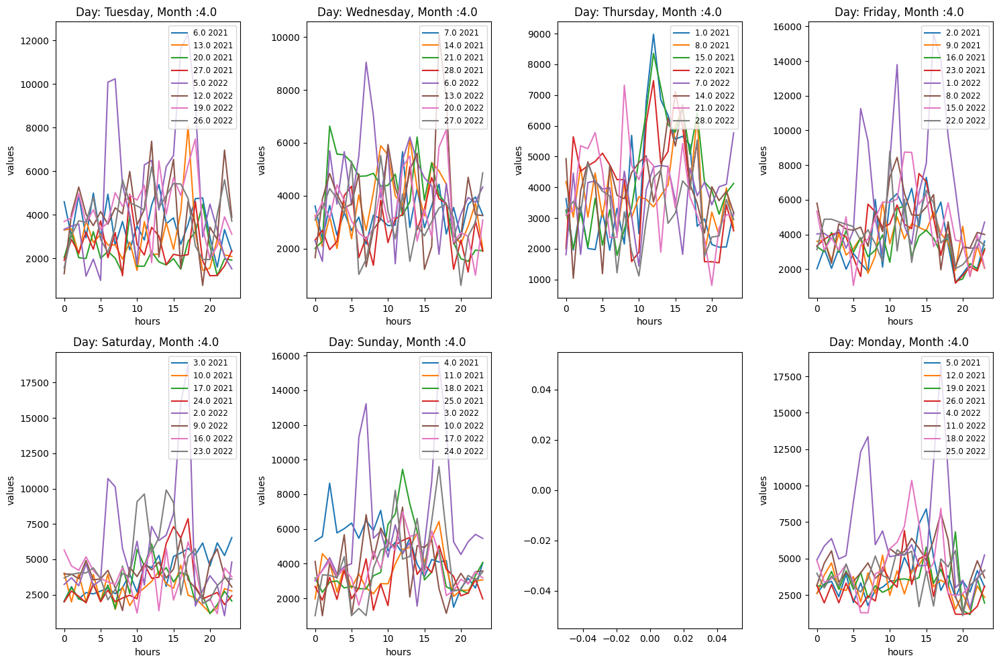

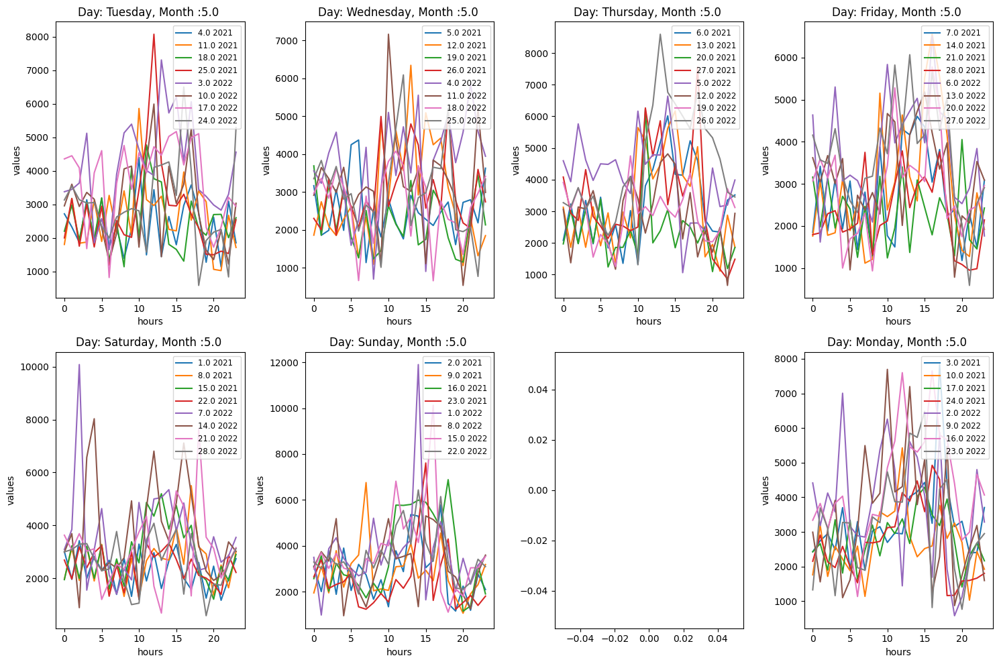

...

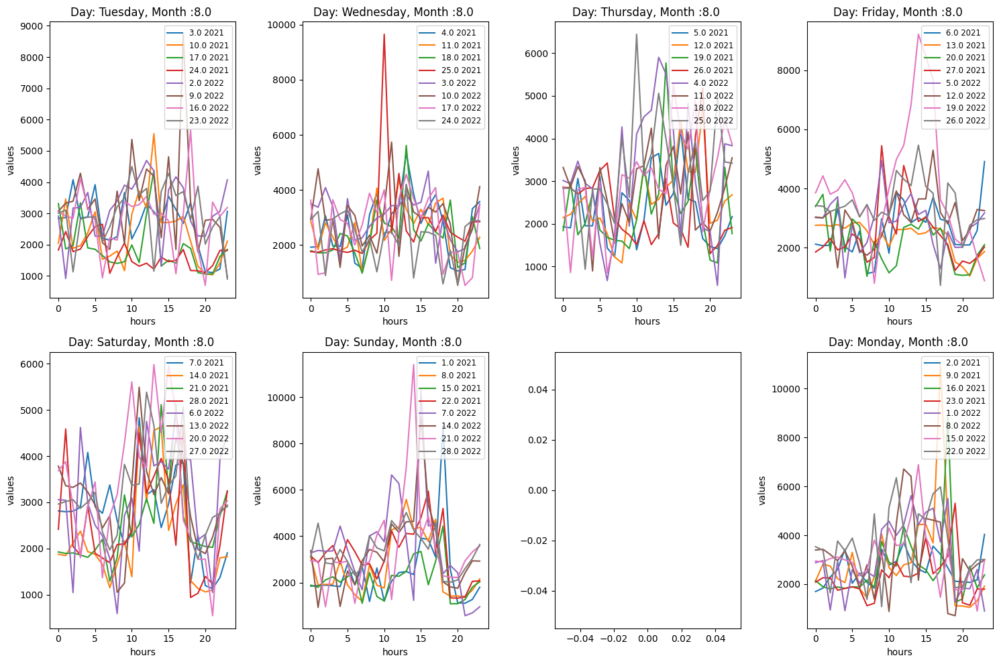

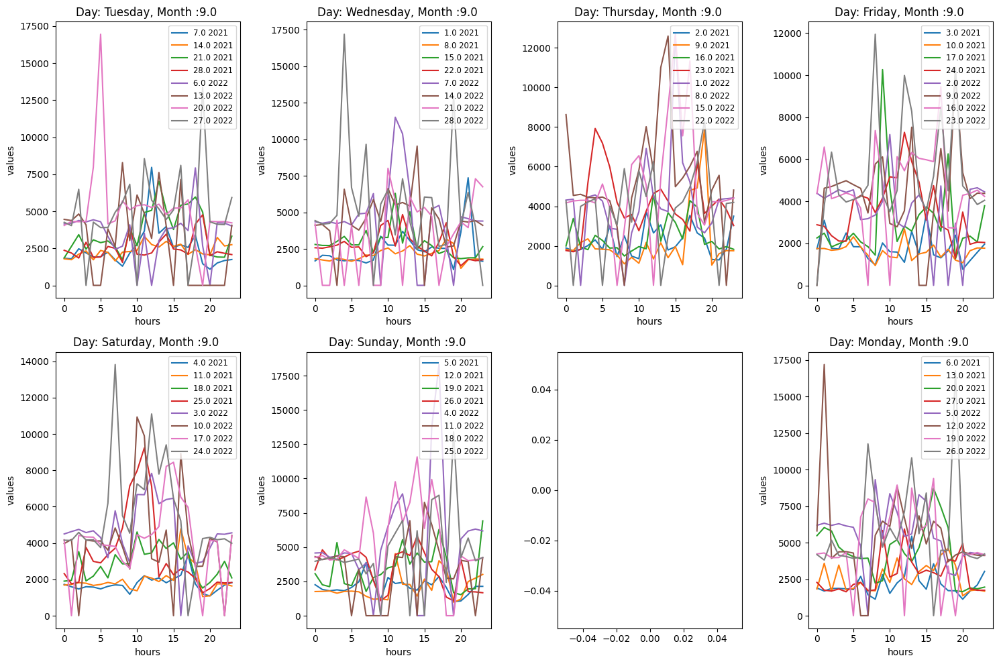

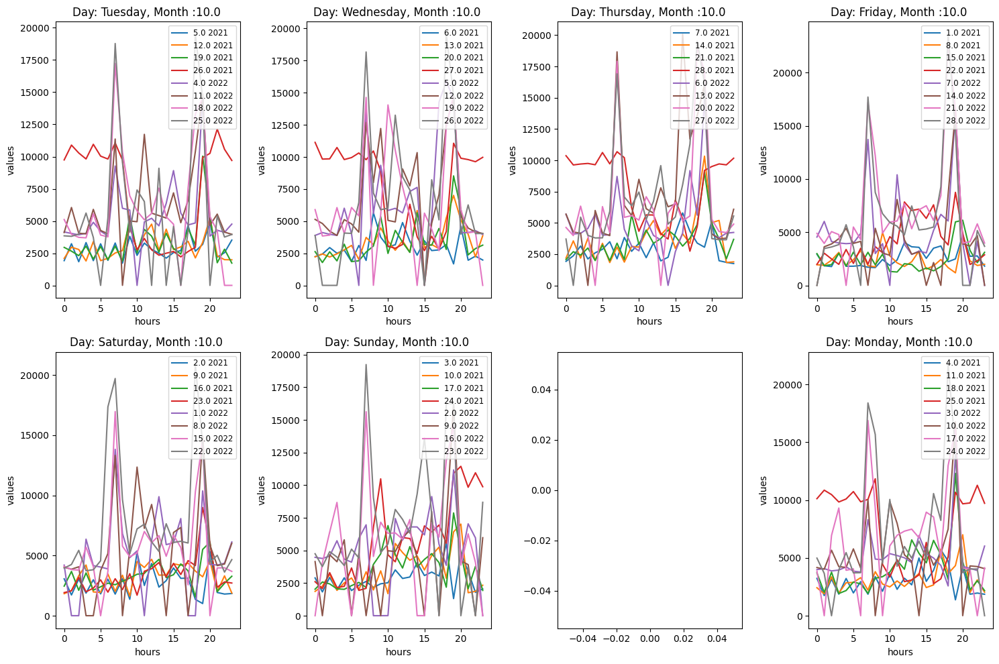

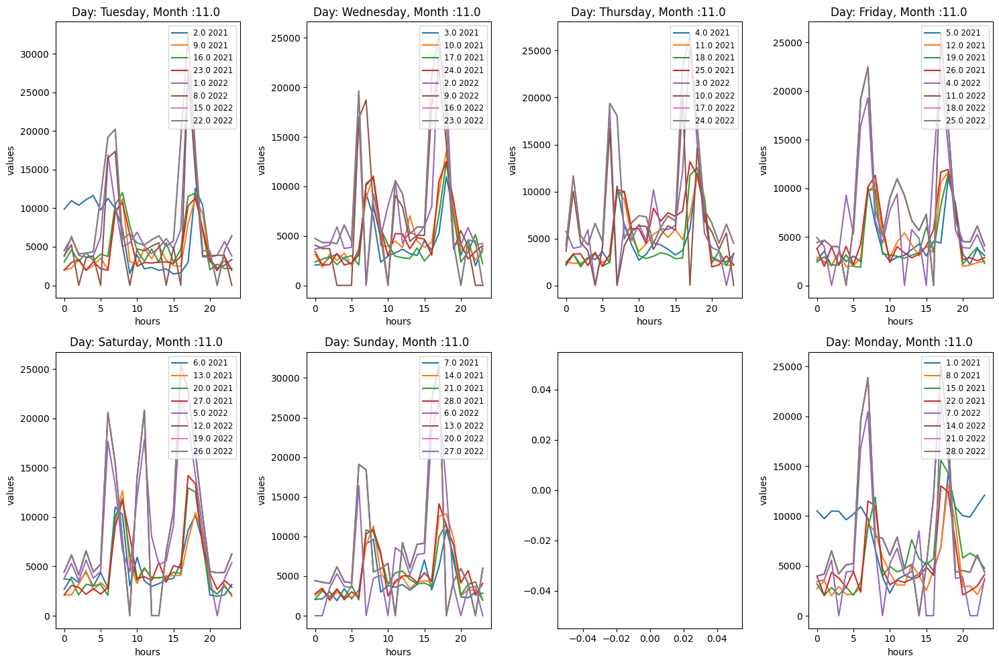

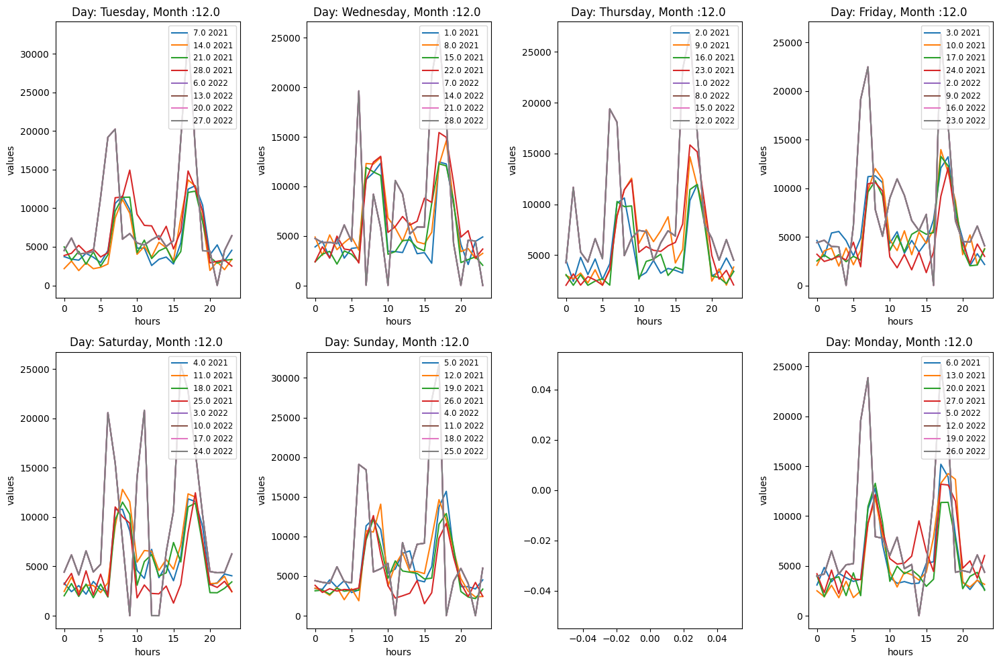

In [156]:
df_2021=pd.read_csv('/content/df_NO_2021.csv')
df_2022=pd.read_csv('/content/df_NO_2022.csv')
df_2021=allote_2021(df_2021)
df_2022=allote_2022(df_2022)
make_graph(df_2022,df_2021,'NO.pdf')